# Поиск изображений по запросу

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import tqdm

from sentence_transformers import SentenceTransformer, util
from PIL import Image

import re
import torch
from transformers import BertTokenizer, TFBertModel

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
import torch

from sklearn.linear_model import Ridge
from sklearn.model_selection import GroupShuffleSplit
from sklearn.metrics import mean_absolute_error

SEED = 42
np.random.seed(SEED)
torch.manual_seed(SEED)
tf.keras.utils.set_random_seed(SEED)
tf.random.set_seed(SEED)

ROOT_PATH = 'data'
TRAIN_PATH = 'train_images'
TEST_PATH = 'test_images'

## 1. Исследовательский анализ данных

Датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.         
В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.         
Модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому оценки нужно агрегировать и привести к значениям от 0 до 1.

### Открытие данных

In [2]:
data_img = pd.read_csv(os.path.join(ROOT_PATH, 'train_dataset.csv'))
data_crowd = pd.read_table(os.path.join(ROOT_PATH, 'CrowdAnnotations.tsv'),\
                                        names=['image', 'query_id', 'pos_percent', 'num_pos', 'num_neg'])
data_exp = pd.read_table(os.path.join(ROOT_PATH, 'ExpertAnnotations.tsv'),\
                                      names=['image', 'query_id', 'exp1', 'exp2', 'exp3'])

test_text =  pd.read_csv(os.path.join(ROOT_PATH, 'test_queries.csv'), sep='|')
test_img =  pd.read_csv(os.path.join(ROOT_PATH, 'test_images.csv'))

<hr style='height:2px; background-color: #88BCE8; margin-bottom: 0' />

In [3]:
display(data_img.head(3));
data_img.info()

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


In [4]:
print('Уникальных запросов:', data_img['query_id'].unique().shape[0])
print('Уникальных описаний:', data_img['query_text'].unique().shape[0])
print('Уникальных фото:', data_img['image'].unique().shape[0])

Уникальных запросов: 977
Уникальных описаний: 977
Уникальных фото: 1000


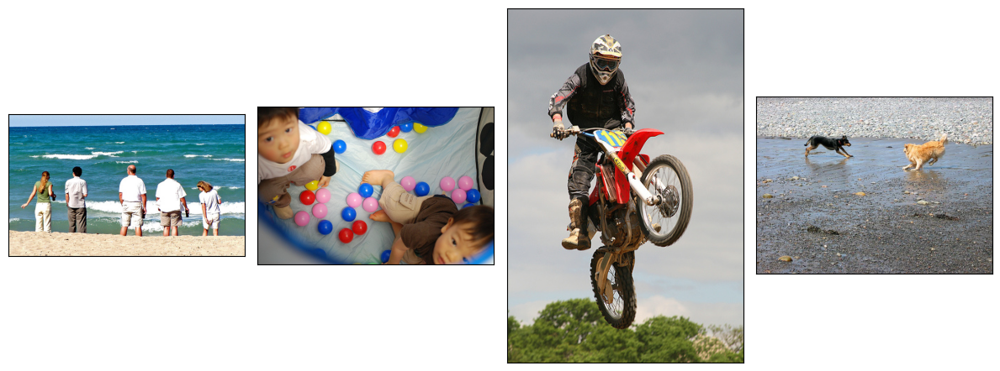

In [5]:
fig, axes = plt.subplots(1, 4, figsize=(12, 12))
for i in range(4):
    img = mpimg.imread(os.path.join(ROOT_PATH, TRAIN_PATH,\
                       data_img.sample(4, random_state=12).reset_index().loc[i, 'image']))
    axes[i].imshow(img)
    axes[i].set_xticks([]); axes[i].set_yticks([]);
plt.tight_layout()

В таблице `data_img` находится имя файла изображения, идентификатор описания и текст описания. Всего в нем 5822 записи. Уникальных фото описано 1000, уникальных описаний к ним всего 977. В тренировочных данных содержатся фото разного размера.

<hr style='height:2px; background-color: #88BCE8; margin-bottom: 0' />

In [6]:
display(data_crowd.head(3))
data_crowd.info()

,image,query_id,pos_percent,num_pos,num_neg
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image        47830 non-null  object 
 1   query_id     47830 non-null  object 
 2   pos_percent  47830 non-null  float64
 3   num_pos      47830 non-null  int64  
 4   num_neg      47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


In [7]:
print('Уникальных запросов:', data_crowd['query_id'].unique().shape[0])
print('Уникальных фото:', data_crowd['image'].unique().shape[0])

Уникальных запросов: 1000
Уникальных фото: 1000


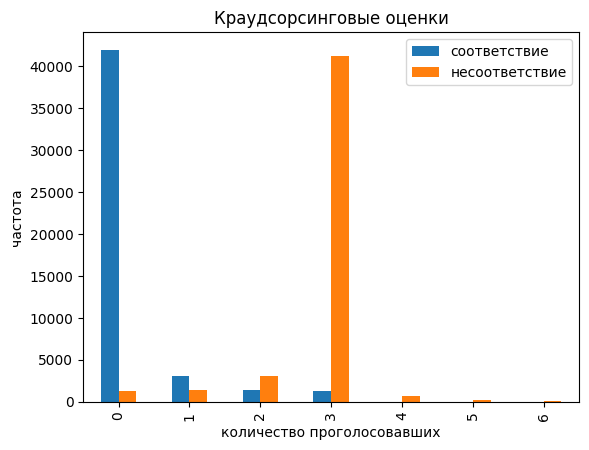

In [8]:
pd.DataFrame([data_crowd['num_pos'].value_counts(),
            data_crowd['num_neg'].value_counts()],
            index=['соответствие', 'несоответствие']).T\
            .plot(kind='bar', title='Краудсорсинговые оценки',
            xlabel='количество проголосовавших', ylabel='частота');

В таблице `data_crowd` - краудсорсинговые оценки. Всего есть 47830 записей с 1000 уникальных запросов и фото. На графике выше видно, что чаще всего люди голосуют за несоответствие запроса и изображения.

<hr style='height:2px; background-color: #88BCE8; margin-bottom: 0' />

In [9]:
display(data_exp.head(3))
data_exp.info()

,image,query_id,exp1,exp2,exp3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   exp1      5822 non-null   int64 
 3   exp2      5822 non-null   int64 
 4   exp3      5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB


In [10]:
print('Уникальных запросов:', data_exp['query_id'].unique().shape[0])
print('Уникальных фото:', data_exp['image'].unique().shape[0])

Уникальных запросов: 977
Уникальных фото: 1000


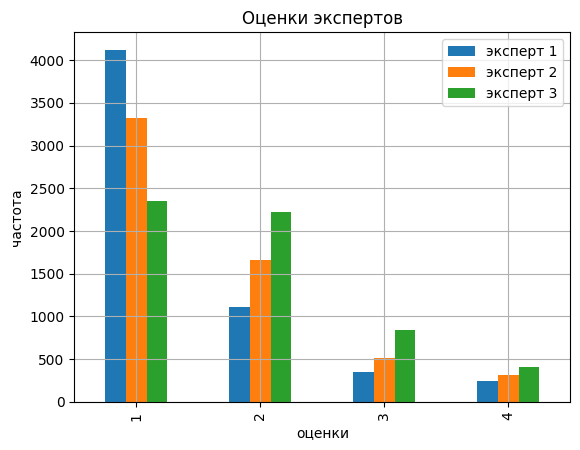

In [11]:
(data_exp[['exp1', 'exp2', 'exp3']].apply(lambda x: x.value_counts()))\
    .plot(kind='bar', grid=True, title='Оценки экспертов', xlabel='оценки', ylabel='частота');
plt.legend(['эксперт 1', 'эксперт 2', 'эксперт 3']);

В таблице `data_exp` информация об оценках экспертов, всего 5822 записей, 1000 уникальных фото и 977 запросов, также, как в таблице `data_img`. Эксперты чаще всего ставят 1 и 2 - по их оценкам в данных большинство пар изображение-описание не подходят друг другу.

<hr style='height:2px; background-color: #88BCE8; margin-bottom: 0' />

In [12]:
display(test_img.head(3))
test_img.info()

,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 932.0+ bytes


In [13]:
print('Уникальных фото:', test_img['image'].unique().shape[0])

Уникальных фото: 100


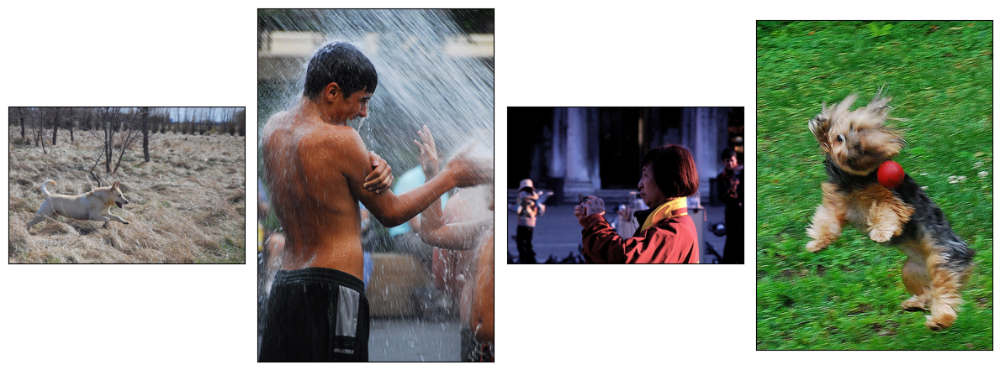

In [14]:
fig, axes = plt.subplots(1, 4, figsize=(12, 12))
for i in range(4):
    img = mpimg.imread(os.path.join(ROOT_PATH, TEST_PATH,\
                       test_img.sample(4, random_state=12).reset_index().loc[i, 'image']))
    axes[i].imshow(img)
    axes[i].set_xticks([]); axes[i].set_yticks([]);
plt.tight_layout()

В таблице `test_img` список названий файлов фото для тестирования. У этих фото также разные размеры.

<hr style='height:2px; background-color: #88BCE8; margin-bottom: 0' />

In [15]:
display(test_text.head(3))
test_text.info()

,Unnamed: 0,query_id,query_text,image
0,0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  500 non-null    int64 
 1   query_id    500 non-null    object
 2   query_text  500 non-null    object
 3   image       500 non-null    object
dtypes: int64(1), object(3)
memory usage: 15.8+ KB


In [16]:
print('Уникальных описаний:', test_text['query_text'].unique().shape[0])
print('Уникальных фото:', test_text['image'].unique().shape[0])

Уникальных описаний: 500
Уникальных фото: 100


И в последней таблице `test_text` - описания для тестовых фото. Для 100 изображений доступно 500 описаний.

### Предобработка данных и оценок

Для дальнейшей работы данные о фотографиях нужно объединить с оценками. Есть два типа оценок - от крауда и от экспертов. Общим ключем для объединения будет `query_id` + `image`.

In [17]:
print('Совпадений в ключе:',
      pd.Series((data_exp['query_id'] + data_exp['image']).unique()).isin(
                (data_img['query_id'] + data_img['image']).unique()).sum())

Совпадений в ключе: 5822


В `data_exp` и `data_img` одинаковое количество записей, и ключи каждой записи совпадают.

In [18]:
print('Совпадений в ключе:',
      pd.Series((data_crowd['query_id'] + data_crowd['image']).unique()).isin(
                (data_img['query_id'] + data_img['image']).unique()).sum())

Совпадений в ключе: 2329


При сравнении ключей в `data_img` и `data_crowd`, совпадений получается всего 2329. Не для каждой записи с экспертной оценкой найдется запись с оценкой крауда - примерно в 3500 записях будут пропуски.

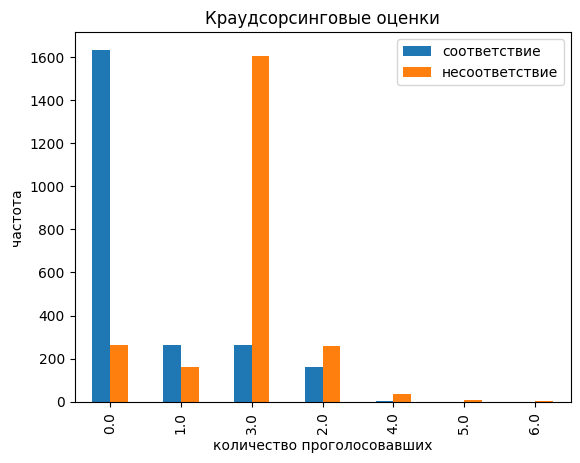

In [19]:
pd.DataFrame([pd.merge(data_img, data_crowd, how='left', on=['image', 'query_id'])['num_pos'].value_counts(),
            pd.merge(data_img, data_crowd, how='left', on=['image', 'query_id'])['num_neg'].value_counts()],
            index=['соответствие', 'несоответствие']).T\
            .plot(kind='bar', title='Краудсорсинговые оценки',
            xlabel='количество проголосовавших', ylabel='частота');

На графике показаны оценки крауда для записей, у которых также есть экспертные оценки. Как и эксперты, независимые люди гораздо чаще помечают картинку несоответствующей запросу. Такие данные не внесут полезной информации, так что для расчета финальной оценки будем использовать только экспертные оценки.

ОБъединим данные:

In [20]:
data_merged = pd.merge(data_img, data_exp, how='left', on=['image', 'query_id'])
display(data_merged.head(3))
data_merged.info()

,image,query_id,query_text,exp1,exp2,exp3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,2,2


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
 3   exp1        5822 non-null   int64 
 4   exp2        5822 non-null   int64 
 5   exp3        5822 non-null   int64 
dtypes: int64(3), object(3)
memory usage: 273.0+ KB


### Анализ оценок

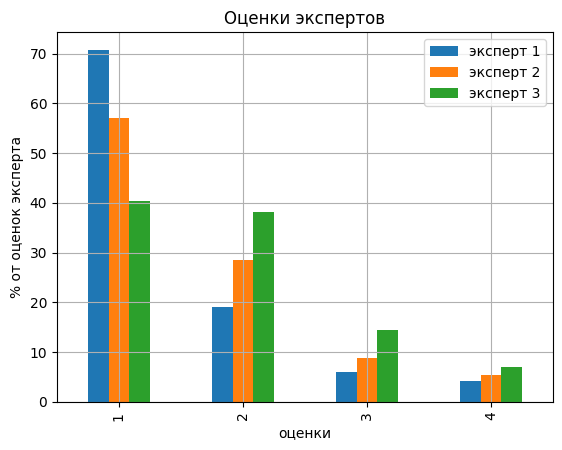

In [21]:
(data_merged[['exp1', 'exp2', 'exp3']].apply(lambda x: x.value_counts())/\
 data_merged['exp1'].shape[0]*100)\
 .plot(kind='bar', grid=True, title='Оценки экспертов', xlabel='оценки', ylabel='% от оценок эксперта');
plt.legend(['эксперт 1', 'эксперт 2', 'эксперт 3']);

Опираясь на оценки экспертов можно сказать, что в данных большинство пар изображение-описание не подходят друг другу - только 5% в среднем полностью подходят, и еще 10% соответствуют в целом без деталей.       
На графике видно, что первый эксперт оценивает строго и чаще других ставит низкие оценки - 70% картинок не подходят под описание совсем, еще 20% слабо подходят, и только оставшиеся 10% подходят под описание. Второй эксперт не такой строгий, третий ставит еще меньше единиц.

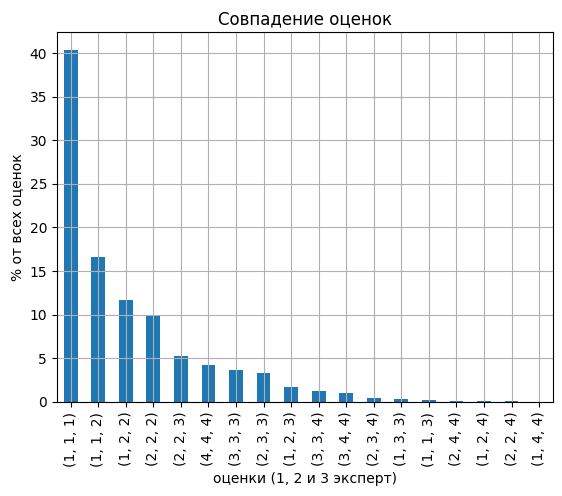

In [22]:
(data_merged[['exp1', 'exp2', 'exp3']].value_counts()/data_merged['exp1'].shape[0]*100)\
    .plot(kind='bar', grid=True, title='Совпадение оценок', xlabel='оценки (1, 2 и 3 эксперт)', ylabel='% от всех оценок');

Из-за разной строгости экспертов оценки могут немного расходиться, но иногда один из них ставит сильно завышенную или заниженную оценку. На графике видно, что мнение экспертов чаще совпадает, чем расходится - ситуации, когда оценки отличаются на 2 довольно редкие, и все вместе составляют не больше 3%. Записи, где эксперты расходятся во мнении, можно удалить.

In [23]:
nono = ['123', '234', '133', '113', '244', '124', '224', '144']
print('Спорных оценок:', data_merged[data_merged[['exp1', 'exp2', 'exp3']].astype('str')\
                                    .agg('sum', axis=1).isin(nono)].shape[0])
data_merged = data_merged.drop(data_merged[data_merged[['exp1', 'exp2', 'exp3']].astype('str')\
                               .agg('sum', axis=1).isin(nono)].index).reset_index(drop=True)
print('Записей в данных:', data_merged.shape[0])

Спорных оценок: 159
Записей в данных: 5663


Эксперты ставят оценку от 1 до 4. Сложим их, получим общую оценку и нормализуем:

In [24]:
expsum = data_merged[['exp1', 'exp2', 'exp3']].sum(axis=1)
data_merged['scores'] = [(x-3) / (12-3) for x in expsum]
data_merged.head(3)

,image,query_id,query_text,exp1,exp2,exp3,scores
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.000000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,2,2,0.222222


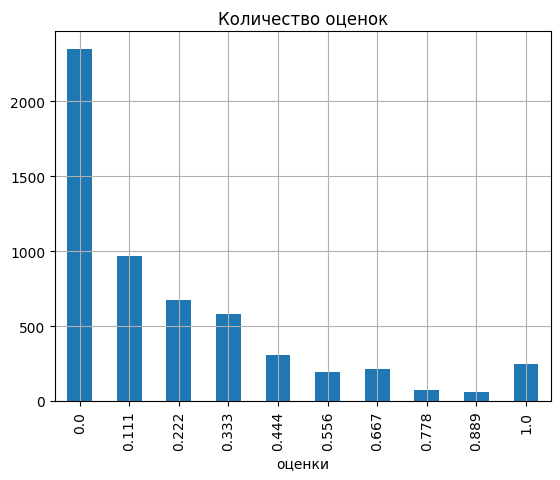

In [25]:
round(data_merged['scores'], 3).value_counts().sort_index()\
    .plot(kind='bar', grid=True, title='Количество оценок', xlabel='оценки');

Теперь полное соответствие запроса и фото выражено 1, а полное несоответствие - 0.

## 2. Проверка данных

В некоторых странах действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.      
Все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки. При попытке посмотреть запрещённые законодательством изображения должен показываться дисклеймер:

> This image is unavailable in your country in compliance with local laws

Составим список слов, которыми можно описать детей и удалим изображения, в описании которых есть эти слова:

In [26]:
banwords = pd.Series(['child', 'children', 'kid', 'kids', 'baby', 'babies',
                      'toddler', 'toddlers', 'infant', 'infants',
                      'teenager', 'teenagers', 'boy', 'boys', 'girl', 'girls'])

In [27]:
def text_check(text):
    txt = list(text.lower().split())
    if banwords.isin(txt).sum() > 0: # проверяем запрос на запрещенные слова
        return False
    return text

In [28]:
tqdm.tqdm.pandas(position=0)
data_merged['good_text'] = data_merged['query_text'].progress_apply(text_check)
data_merged.head(3)

100%|████████████████████████████████████████████████████████████████████████████| 5663/5663 [00:00<00:00, 9954.01it/s]


,image,query_id,query_text,exp1,exp2,exp3,scores,good_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.000000,False
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.000000,False
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,2,2,0.222222,False


In [29]:
bad_queries = data_merged.loc[data_merged['good_text'] == False]['query_id']
bad_images = pd.Series([x[:-2] for x in bad_queries]).unique()
data_merged = data_merged.drop(data_merged.loc[data_merged['image'].isin(bad_images)].index).reset_index(drop=True)
data_merged

,image,query_id,query_text,exp1,exp2,exp3,scores,good_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.000000,False
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.000000,False
2,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.000000,False
3,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.000000,False
4,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.000000,False
...,...,...,...,...,...,...,...,...
3979,561417861_8e25d0c0e8.jpg,410453140_5401bf659a.jpg#2,A man stands at the entrance of Yerba Buena Ce...,2,2,2,0.333333,A man stands at the entrance of Yerba Buena Ce...
3980,561940436_64d6fc125d.jpg,3157847991_463e006a28.jpg#2,Two men in black jackets behind a white handra...,1,1,2,0.111111,Two men in black jackets behind a white handra...
3981,70995350_75d0698839.jpg,3200120942_59cfbb3437.jpg#2,One person is on a ski lift while another snow...,1,1,2,0.111111,One person is on a ski lift while another snow...
3982,909808296_23c427022d.jpg,2112921744_92bf706805.jpg#2,A dog stands on the side of a grassy cliff .,2,2,2,0.333333,A dog stands on the side of a grassy cliff .


В данных осталось 3984 записи, на которых можно обучить модель.

## 3. Векторизация изображений

Самый примитивный способ векторизации — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Выберем предобученную модель ResNet-50 и исключим полносвязные слои, которые отвечают за конечное предсказание.

In [30]:
backbone = ResNet50(input_shape=(224, 224, 3), include_top=False, weights='imagenet')
img_model = Sequential()
img_model.add(backbone)
img_model.add(layers.GlobalAveragePooling2D())
img_model.compile(optimizer=Adam(learning_rate=0.0001))

In [31]:
datagen = ImageDataGenerator(rescale=1./255)
def get_img_vector(imgs, path):
    train_gen_flow = datagen.flow_from_dataframe(
            dataframe=imgs,
            directory=path,
            x_col='image',
            target_size=(224, 224),
            batch_size=16,
            class_mode='input',
            shuffle=False,
            seed=SEED)
    img_vec = img_model.predict(train_gen_flow, verbose=1)
    return pd.Series(img_vec.tolist())

In [32]:
imgs = pd.DataFrame()
imgs['image'] = pd.Series(data_merged['image'].unique())
imgs.head(3)

,image
0,1056338697_4f7d7ce270.jpg
1,1262583859_653f1469a9.jpg
2,2621415349_ef1a7e73be.jpg


In [33]:
imgs['img_vec'] = get_img_vector(imgs, os.path.join(ROOT_PATH, TRAIN_PATH))

Found 711 validated image filenames.
45/45 [==============================] - 42s 909ms/step


In [34]:
print(imgs['img_vec'].head(3))
print('Уникальных фото:', imgs.shape[0])
print('Длина вектора:', len(imgs['img_vec'][0]))

0    [0.0, 0.0, 0.007829717360436916, 0.0, 1.220194...
1    [0.0, 0.0, 0.0, 0.0, 0.9342659711837769, 0.0, ...
2    [0.0, 0.0, 0.0, 0.0, 1.2475485801696777, 0.0, ...
Name: img_vec, dtype: object
Уникальных фото: 711
Длина вектора: 2048


In [35]:
data_merged = pd.merge(data_merged, imgs, on=['image'])
display(data_merged.head(3))
print('Размер датафрейма:', data_merged.shape)

,image,query_id,query_text,exp1,exp2,exp3,scores,good_text,img_vec
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.000000,False,"[0.0, 0.0, 0.007829717360436916, 0.0, 1.220194..."
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,1,1,2,0.111111,False,"[0.0, 0.0, 0.007829717360436916, 0.0, 1.220194..."
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,1,1,2,0.111111,A man sleeps under a blanket on a city street .,"[0.0, 0.0, 0.007829717360436916, 0.0, 1.220194..."


Размер датафрейма: (3984, 9)


Всего в данных 704 уникальных фотографии - для каждой из них найден вектор размером (1, 2048).

## 4. Векторизация текстов

Следующий этап — векторизация текстов. Для работы с текстом выберем трансформер Bert:

In [36]:
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
txt_model = TFBertModel.from_pretrained('bert-base-uncased')

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.transform.dense.weight', 'cls.predictions.bias', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.weight']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

In [37]:
def get_text_vector(text_):
    txt = tokenizer.encode(text_, add_special_tokens = True, return_tensors="tf")
    res = None
    with torch.no_grad():
        res = txt_model.bert(input_ids=txt).last_hidden_state.numpy().mean(axis=1)
    return res

In [38]:
texts = pd.DataFrame()
texts['query_text'] = pd.Series(data_merged['query_text'].unique())
texts.head(3)

,query_text
0,A young child is wearing blue goggles and sitt...
1,A girl wearing a yellow shirt and sunglasses s...
2,A man sleeps under a blanket on a city street .


In [39]:
tqdm.tqdm.pandas(position=0)
texts['text_vec'] =  texts['query_text'].progress_apply(get_text_vector)

100%|████████████████████████████████████████████████████████████████████████████████| 939/939 [04:14<00:00,  3.69it/s]


In [40]:
print(texts['text_vec'].head(3))
print('Уникальных текстов:', texts.shape[0])
print('Длина вектора:', len(texts['text_vec'][0][0]))

0    [[0.21968098, -0.14340703, 0.013692823, 0.1637...
1    [[0.5010983, -0.2453535, -0.13488652, -0.14416...
2    [[0.4954744, -0.2203711, 0.15132761, 0.0218806...
Name: text_vec, dtype: object
Уникальных текстов: 939
Длина вектора: 768


In [41]:
data_merged = pd.merge(data_merged, texts, on=['query_text'])
display(data_merged.head(3))
print('Размер датафрейма:', data_merged.shape)

,image,query_id,query_text,exp1,exp2,exp3,scores,good_text,img_vec,text_vec
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,False,"[0.0, 0.0, 0.007829717360436916, 0.0, 1.220194...","[[0.21968098, -0.14340703, 0.013692823, 0.1637..."
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,False,"[0.0, 0.0, 0.0, 0.0, 0.9342659711837769, 0.0, ...","[[0.21968098, -0.14340703, 0.013692823, 0.1637..."
2,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,False,"[0.0, 0.0, 0.0, 0.0, 1.2475485801696777, 0.0, ...","[[0.21968098, -0.14340703, 0.013692823, 0.1637..."


Размер датафрейма: (3984, 10)


Получили для каждого описания векторное представление.

## 5. Объединение векторов

Теперь нужно подготовить данные для обучения - объединить векторы изображений и векторы текстов с целевой переменной.

In [42]:
def get_data_vector(img, text):
    return np.concatenate([[img], text], axis=1)

In [43]:
tqdm.tqdm.pandas()
data_merged['train_vec'] = data_merged.progress_apply(lambda x: get_data_vector(x['img_vec'], x['text_vec']), axis=1)
data_merged['train_vec'][0].shape

100%|████████████████████████████████████████████████████████████████████████████| 3984/3984 [00:00<00:00, 9805.69it/s]


(1, 2816)

In [44]:
data = data_merged[['image', 'train_vec', 'scores']]
data.head(3)

,image,train_vec,scores
0,1056338697_4f7d7ce270.jpg,"[[0.0, 0.0, 0.007829717360436916, 0.0, 1.22019...",0.0
1,1262583859_653f1469a9.jpg,"[[0.0, 0.0, 0.0, 0.0, 0.9342659711837769, 0.0,...",0.0
2,2621415349_ef1a7e73be.jpg,"[[0.0, 0.0, 0.0, 0.0, 1.2475485801696777, 0.0,...",0.0


Длина вектора обучения - 2816. Дальше из данных пригодится только этот вектор, оценки и название файла фотографии.

## 6. Обучение модели предсказания соответствия

Сначала разделим датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 8:2 так, что строки с одинаковым значением `image` будут содержаться либо в тестовом, либо в тренировочном датасете.

### Подготовка признаков

In [45]:
gss = GroupShuffleSplit(n_splits=1, train_size=.8, random_state=SEED)
train_indices, test_indices = next(gss.split(X=data.drop(columns=['scores']), y=data['scores'], groups=data['image']))
train_df, test_df = data.loc[train_indices].reset_index(drop=True), data.loc[test_indices].reset_index(drop=True)
train_df.head(3)

,image,train_vec,scores
0,1056338697_4f7d7ce270.jpg,"[[0.0, 0.0, 0.007829717360436916, 0.0, 1.22019...",0.0
1,1262583859_653f1469a9.jpg,"[[0.0, 0.0, 0.0, 0.0, 0.9342659711837769, 0.0,...",0.0
2,2621415349_ef1a7e73be.jpg,"[[0.0, 0.0, 0.0, 0.0, 1.2475485801696777, 0.0,...",0.0


In [46]:
train_vec = train_df['train_vec'].reset_index(drop=True)
val_vec = test_df['train_vec'].reset_index(drop=True)
target_train = train_df['scores'].reset_index(drop=True)
target_val = test_df['scores'].reset_index(drop=True)

### Линейная регрессия

Начнем обучать модели.           
Метрикой качества будет средняя ошибка MAE - она покажет, насколько отличаются предсказания от реальных значений.

Первая модель - гребневая регрессия. Посмотрим на результат обучения со стандартными параметрами:

Среднее значение: 0.23721881390593044
MAE: 0.2173434800970442


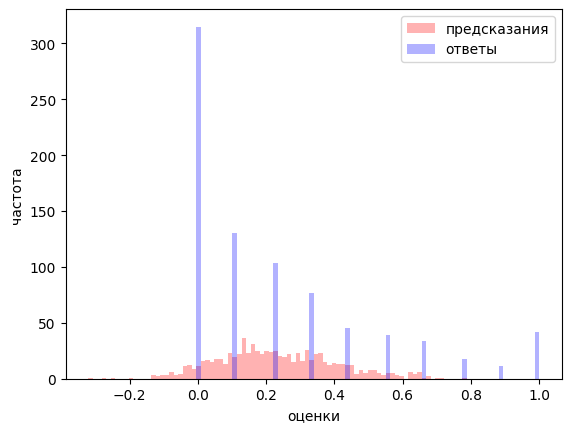

In [47]:
model = Ridge()
model.fit(np.concatenate(train_vec), target_train)
preds = model.predict(np.concatenate(val_vec))

print('Среднее значение:', target_val.mean())
print('MAE:', mean_absolute_error(preds, target_val))
pd.DataFrame(np.hstack([preds.reshape(-1, 1), target_val.array.reshape(-1, 1)]))\
            .plot(kind='hist', bins=100, style='.', color=['red', 'blue'], alpha=0.3,
                  xlabel='оценки', ylabel='частота');
plt.legend(['предсказания', 'ответы']);

Среднее значение целевой переменной равно 0.2372, МАЕ модели немного меньше. На графике видно, что модель не предсказывает значения больше 0.8, а также иногда дает отрицательные предсказания.      
Значительно усилим регуляризацию и сменим алгоритм на `lbfgs`:

Среднее значение: 0.23721881390593044
MAE: 0.2040591635574823


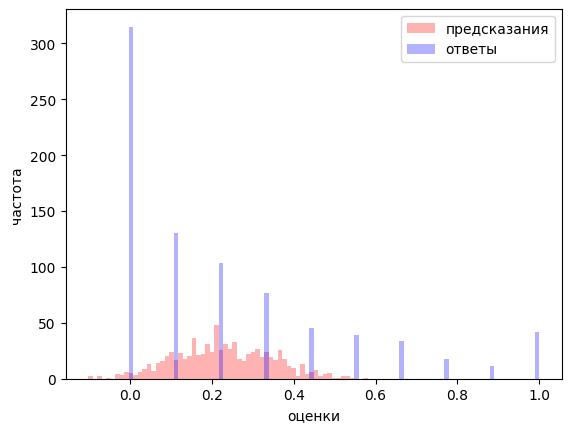

In [48]:
model = Ridge(alpha=50, tol=0.00001, solver='lbfgs', positive=True)
model.fit(np.concatenate(train_vec), target_train)
preds = model.predict(np.concatenate(val_vec))

print('Среднее значение:', target_val.mean())
print('MAE:', mean_absolute_error(preds, target_val))
pd.DataFrame(np.hstack([preds.reshape(-1, 1), target_val.array.reshape(-1, 1)]))\
            .plot(kind='hist', bins=100, style='.', color=['red', 'blue'], alpha=0.3,
                  xlabel='оценки', ylabel='частота');
plt.legend(['предсказания', 'ответы']);

Результат немного улучшился - теперь МАЕ всего 0.204, отрицательных предсказаний почти не осталось. При этом большая часть предсказаний все также находится в пределах от 0.1 до 0.3, а максимальное предсказанное значение теперь 0.6.       
Дальнейший перебор гиперпараметров мог бы дать небольшое уменьшение ошибки, но значительного улучшения качества прогноза ждать бесполезно. Попробуем взять модель сложнее.

### Нейронная сеть

Построим полносвязную нейронную сеть прямого распространения:

In [49]:
def create_model(input_shape):
    np.random.seed(SEED)
    torch.manual_seed(SEED)
    tf.keras.utils.set_random_seed(SEED)
    tf.random.set_seed(SEED)
    model = Sequential()
    model.add(layers.Dense(128, input_shape=(input_shape,)))
    model.add(layers.BatchNormalization())
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dropout(0.2))
    model.add(layers.Dense(32, activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.Dense(16, activation='relu'))
    model.add(layers.Dropout(0.2))
    model.add(layers.Dense(4, activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.Dense(1,  activation='sigmoid'))
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse',
                  metrics=['mae'])
    return model

def train_model(model, train_data, test_data, epochs=100,
               steps_per_epoch=None, validation_steps=None):
    features_train, target_train = train_data
    model.fit(features_train, target_train,
              validation_data=test_data,
              epochs=epochs,
              steps_per_epoch=steps_per_epoch,
              validation_steps=validation_steps,
              verbose=2, shuffle=True)
    return model

In [50]:
m = create_model(train_vec[0].shape[1])
mn = train_model(m, (np.concatenate(train_vec), target_train),
                    (np.concatenate(val_vec), target_val))
preds = mn.predict(np.concatenate(val_vec))

Epoch 1/100


100/100 - 3s - loss: 0.1474 - mae: 0.3309 - val_loss: 0.1054 - val_mae: 0.2841 - 3s/epoch - 26ms/step
Epoch 2/100
100/100 - 1s - loss: 0.1079 - mae: 0.2786 - val_loss: 0.1191 - val_mae: 0.2966 - 659ms/epoch - 7ms/step
Epoch 3/100
100/100 - 1s - loss: 0.0917 - mae: 0.2509 - val_loss: 0.0772 - val_mae: 0.2272 - 720ms/epoch - 7ms/step
Epoch 4/100
100/100 - 1s - loss: 0.0805 - mae: 0.2318 - val_loss: 0.0809 - val_mae: 0.2236 - 670ms/epoch - 7ms/step
Epoch 5/100
100/100 - 0s - loss: 0.0726 - mae: 0.2165 - val_loss: 0.0687 - val_mae: 0.1977 - 470ms/epoch - 5ms/step
Epoch 6/100
100/100 - 1s - loss: 0.0670 - mae: 0.2046 - val_loss: 0.0699 - val_mae: 0.2012 - 522ms/epoch - 5ms/step
Epoch 7/100
100/100 - 1s - loss: 0.0643 - mae: 0.1971 - val_loss: 0.0694 - val_mae: 0.1989 - 899ms/epoch - 9ms/step
Epoch 8/100
100/100 - 0s - loss: 0.0623 - mae: 0.1916 - val_loss: 0.0704 - val_mae: 0.1934 - 448ms/epoch - 4ms/step
Epoch 9/100
100/100 - 1s - loss: 0.0618 - mae: 0.1888 - val_loss: 0.0695

Среднее значение: 0.23721881390593044
MAE: 0.19552859934725156


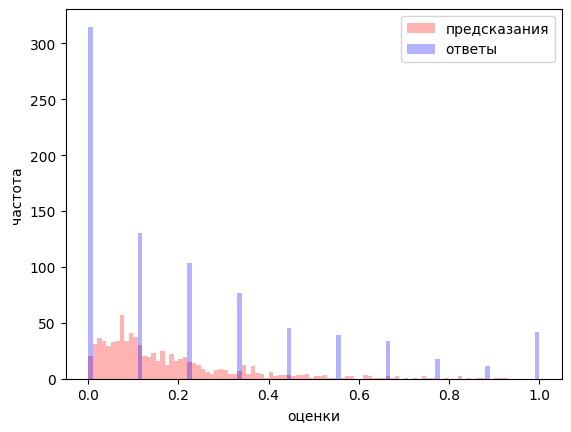

In [51]:
print('Среднее значение:', target_val.mean())
print('MAE:', mean_absolute_error(preds, target_val.reset_index(drop=True)))

pd.DataFrame(np.hstack([preds.reshape(-1, 1), target_val.reset_index(drop=True).array.reshape(-1, 1)]))\
            .plot(kind='hist', bins=100, style='.', color=['red', 'blue'], alpha=0.3,
                  xlabel='оценки', ylabel='частота');
plt.legend(['предсказания', 'ответы']);

Слои сети и количество нейронов в них были подобраны экспериментально.      
МАЕ текущей модели немного меньше - 0.1955. Предсказания теперь находятся не только в диапазоне от 0.1 до 0.4. Они распределены похоже на ответы - чем выше оценка, тем реже она встречается, хотя ставить оценки больше 0.8 модель также не торопится.

## 7. Тестирование модели

Настало время протестировать модель. Получим эмбеддинги для всех тестовых изображений из папки `test_images`:

In [52]:
test_img_vec = get_img_vector(test_img, os.path.join(ROOT_PATH, TEST_PATH))
test_img_vec.head(3)

Found 100 validated image filenames.
7/7 [==============================] - 6s 811ms/step


0    [0.0, 0.0, 0.0, 0.0, 0.9385553598403931, 0.0, ...
1    [0.0, 0.0, 0.0, 0.0, 1.0767621994018555, 0.0, ...
2    [0.0, 0.0, 0.00021453536464832723, 0.0, 1.2151...
dtype: object

Из тестовых данных выберем 10 случайных запросов:

In [53]:
text_sample = test_text.sample(10, random_state=SEED*10)
tqdm.tqdm.pandas(position=0)
test_text_vec = text_sample['query_text'].progress_apply(text_check)
test_text_vec

100%|████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 3447.56it/s]


399      A man waterskiing through the air near a dock .
1                                                  False
199                                                False
497    A black dog holding a weight in its mouth stan...
383    A man with something orange on his helmet ridi...
120                                                False
156    An ice skating park in winter , with many peop...
444                The shoppers are walking in a store .
264    The man with the white head piece looks left d...
140                                                False
Name: query_text, dtype: object

Теперь для каждого запроса найдем наиболее подходящую картинку.

Код ниже проверяет, не нарушает ли запрос законодательство. Если да - выводится дисклеймер. Если нет, то запрос преобразовывается в вектор, объединяется с вектором фото и для каждой пары запрос-фото модель вычисляет, насколько они подходят друг другу. После из всех пар выбирается 3 самых подходящих фотографии, и мы можем визуально сравнить их с оригинальным фото по запросу.

1 . A man waterskiing through the air near a dock .
4/4 [==============================] - 0s 2ms/step


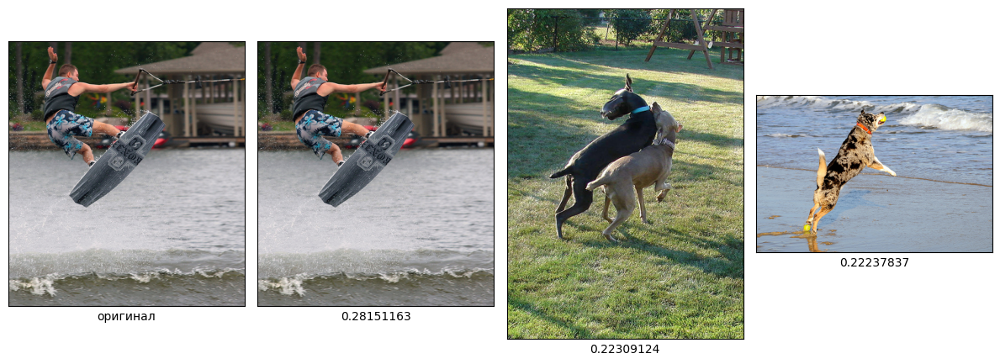

▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬
2 . Two boys are squirting water guns at each other .
This image is unavailable in your country in compliance with local laws.
▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬
3 . The little girl tackles a man and makes the universal sign for " Touchdown ! "
This image is unavailable in your country in compliance with local laws.
▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬
4 . A black dog holding a weight in its mouth stands next to a person .
4/4 [==============================] - 0s 3ms/step


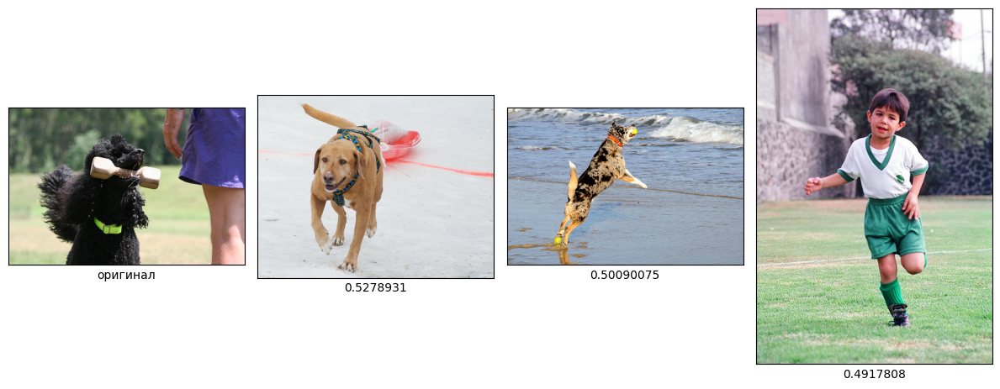

▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬
5 . A man with something orange on his helmet riding a bike in a busy setting .
4/4 [==============================] - 0s 3ms/step


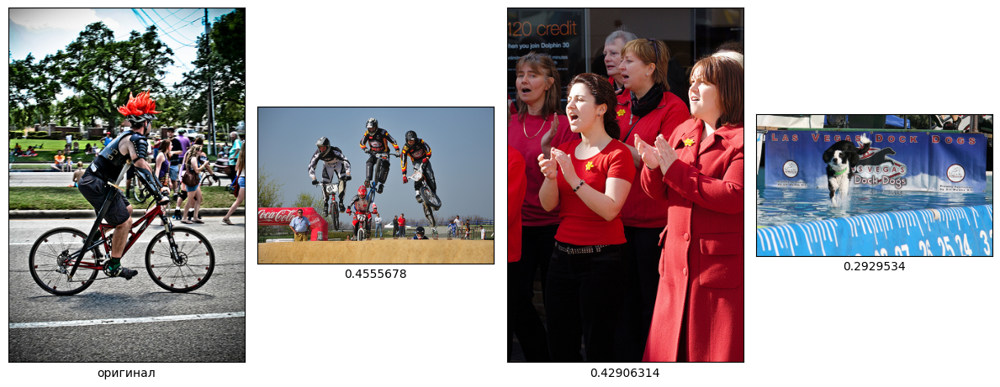

▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬
6 . A boy flying a red and white kite .
This image is unavailable in your country in compliance with local laws.
▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬
7 . An ice skating park in winter , with many people .
4/4 [==============================] - 0s 2ms/step


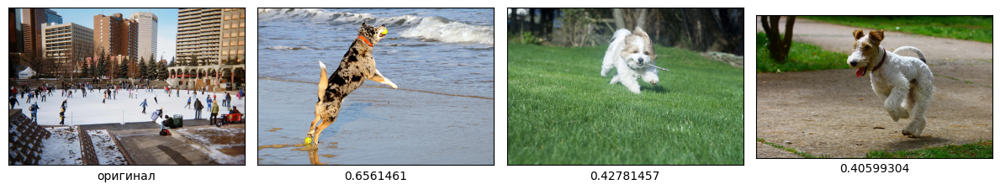

▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬
8 . The shoppers are walking in a store .
4/4 [==============================] - 0s 3ms/step


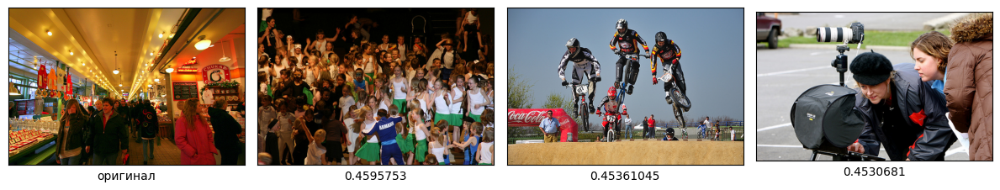

▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬
9 . The man with the white head piece looks left down the street .
4/4 [==============================] - 0s 2ms/step


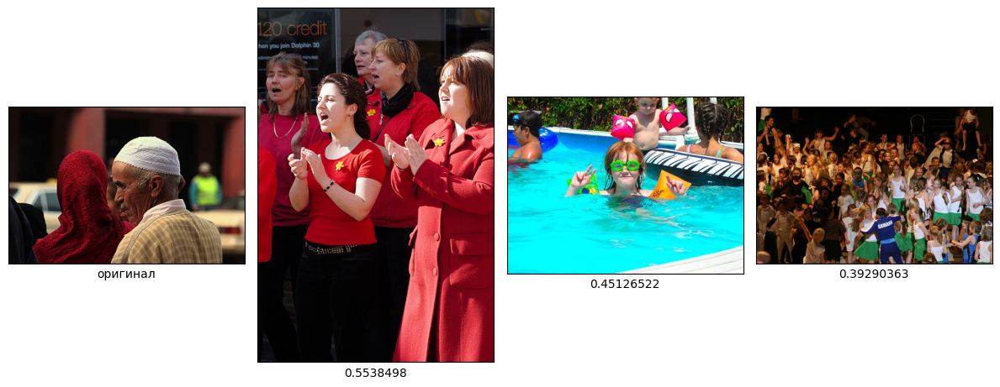

▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬
10 . A boy and a girl at the beach , throwing sand .
This image is unavailable in your country in compliance with local laws.
▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬


In [54]:
num = 0
for n in text_sample.index:
    num = num+1
    print(num, '.', text_sample['query_text'][n])
    test_text_vec = text_check(text_sample['query_text'][n])
    if test_text_vec == False:
        print('This image is unavailable in your country in compliance with local laws.')
    else:
        data_ = pd.DataFrame()
        data_['img'] = test_img['image']
        data_['img_vec'] = test_img_vec
        data_['text_vec'] = pd.Series([get_text_vector(test_text_vec)] * 100)
        data_['vec'] = data_.apply(lambda x: get_data_vector(x['img_vec'], x['text_vec']), axis=1)

        data_['preds'] = mn.predict(np.concatenate(data_['vec']))
        topres = data_.sort_values('preds', ascending=False).reset_index(drop=True)[0:3]
        
        fig, axes = plt.subplots(1, 4, figsize=(12, 12))
        img = mpimg.imread(os.path.join(ROOT_PATH, TEST_PATH, text_sample['image'][n]))
        axes[0].imshow(img)
        axes[0].set_xlabel('оригинал')
        axes[0].set_xticks([]); axes[0].set_yticks([]);
        for i in range(1, 4):
            img = mpimg.imread(os.path.join(ROOT_PATH, TEST_PATH, topres.loc[i-1, 'img']))
            axes[i].imshow(img)
            axes[i].set_xlabel(topres.loc[i-1, 'preds'])
            axes[i].set_xticks([]); axes[i].set_yticks([]);
        plt.tight_layout()
        plt.show()
    print('▬'*100)

Из 10 тестовых запросов 4 были заблокированы. Из оставшихся 6 модель нашла 1 полностью соответствующую фотографию.

## 8. Альтернативное решение

Для демонстрационной версии поиска изображений по запросу можно воспользоваться моделью, не требующей обучения. Проведем эксперимент с нейронной сетью CLIP от OPEN AI.

In [55]:
clip = SentenceTransformer("clip-ViT-B-32")

In [56]:
tqdm.tqdm.pandas(position=0)
test_img_vec = test_img.progress_apply(lambda x: clip.encode(
                        Image.open(os.path.join(ROOT_PATH, TEST_PATH, x.item()))), axis=1)

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:28<00:00,  3.54it/s]


In [57]:
text_sample = test_text.sample(10, random_state=SEED*10)
tqdm.tqdm.pandas(position=0)
test_text_vec = text_sample['query_text'].progress_apply(text_check)

100%|████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 5181.35it/s]


1 . A man waterskiing through the air near a dock .


C:\Users\user\AppData\Local\Programs\Python\Python311\Lib\site-packages\sentence_transformers\util.py:40: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ..\torch\csrc\utils\tensor_new.cpp:264.)
  b = torch.tensor(b)


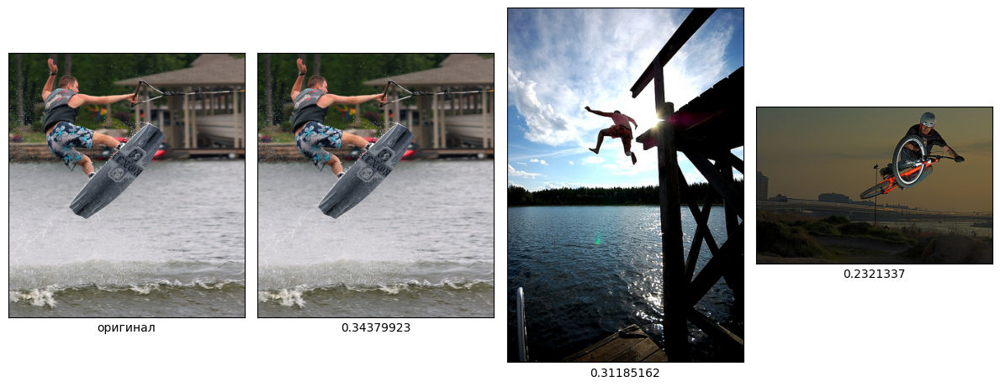

▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬
2 . Two boys are squirting water guns at each other .
This image is unavailable in your country in compliance with local laws.
▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬
3 . The little girl tackles a man and makes the universal sign for " Touchdown ! "
This image is unavailable in your country in compliance with local laws.
▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬
4 . A black dog holding a weight in its mouth stands next to a person .


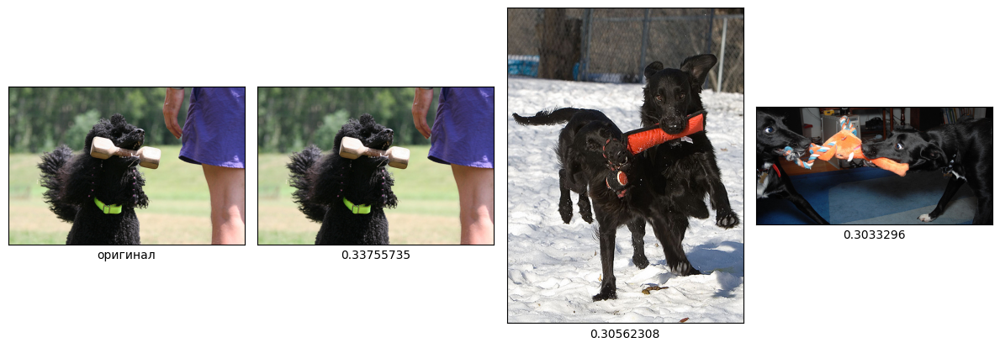

▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬
5 . A man with something orange on his helmet riding a bike in a busy setting .


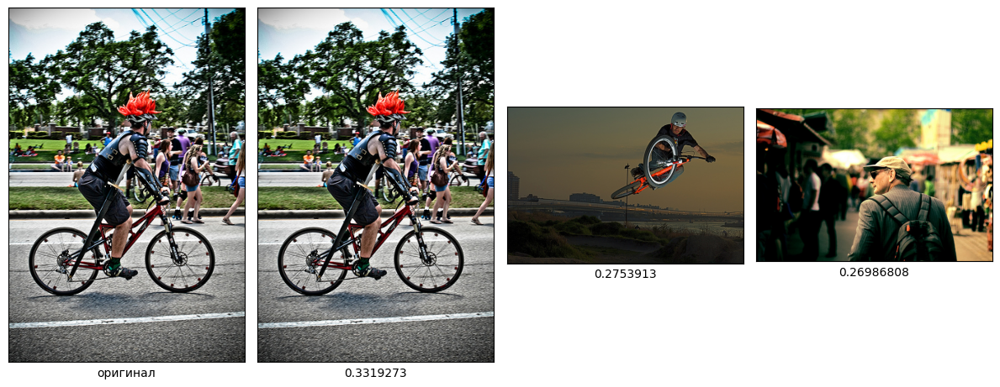

▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬
6 . A boy flying a red and white kite .
This image is unavailable in your country in compliance with local laws.
▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬
7 . An ice skating park in winter , with many people .


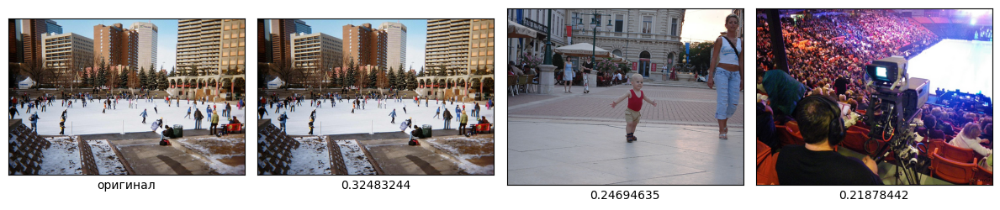

▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬
8 . The shoppers are walking in a store .


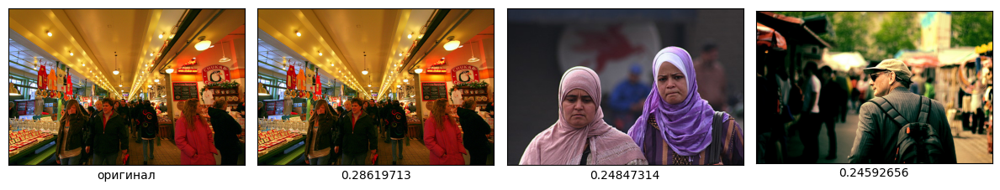

▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬
9 . The man with the white head piece looks left down the street .


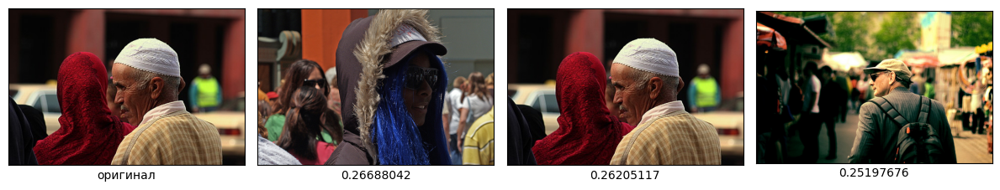

▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬
10 . A boy and a girl at the beach , throwing sand .
This image is unavailable in your country in compliance with local laws.
▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬▬


In [58]:
num = 0
for n in text_sample.index:
    num = num+1
    print(num, '.', text_sample['query_text'][n])
    test_text_vec = text_check(text_sample['query_text'][n])
    if test_text_vec == False:
        print('This image is unavailable in your country in compliance with local laws.')
    else:
        data_ = pd.DataFrame()
        data_['img'] = test_img['image']
        data_['img_vec'] = test_img_vec

        text_emb = clip.encode(test_text_vec)
        data_['cos_scores'] = util.cos_sim(text_emb, test_img_vec).numpy()[0]
        topres = data_.sort_values('cos_scores', ascending=False).reset_index(drop=True)[0:3]

        fig, axes = plt.subplots(1, 4, figsize=(12, 12))
        img = mpimg.imread(os.path.join(ROOT_PATH, TEST_PATH, text_sample['image'][n]))
        axes[0].imshow(img)
        axes[0].set_xlabel('оригинал')
        axes[0].set_xticks([]); axes[0].set_yticks([]);
        for i in range(1, 4):
            img = mpimg.imread(os.path.join(ROOT_PATH, TEST_PATH, topres.loc[i-1, 'img']))
            axes[i].imshow(img)
            axes[i].set_xlabel(topres.loc[i-1, 'cos_scores'])
            axes[i].set_xticks([]); axes[i].set_yticks([]);
        plt.tight_layout()
        plt.show()
    print('▬'*100)

Для 5 запросов из 6 модель нашла полностью соответствующую фотографию, для 1 запроса - два похожих фото и оригинал.

## Вывод

Перед обучением модели данные нужно было подготовить:
- объединить запросы и оценки;
- исключить изображения по запросам, попадающим под ограничения;
- преобразовать тексты и фото в векторы.
  
Целевой признак также нужно было подготовить - агрегировать оценки и привести их к значениям от 0 до 1. Для вычисления финальной оценки решено было использовать только экспертные оценки.

Моделей было рассмотрено два типа - гребневая регрессия и нейронная сеть.        
У регрессии средняя ошибка МАЕ составила 0.204 при среднем значении ответов 0.2372. Предсказания были сосредоточены в диапазоне от 0.1 до 0.4.      
Нейронная сеть в лучшей найденной конфигурации показывает МАЕ 0.1955. Это немного лучше, чем у регрессии. На графиках предсказания не выглядят "усредненными": они распределены похоже на ответы - чем выше оценка, тем реже она встречается.    
На тесте модель нашла одну картинку, полностью соответствующей запросу. Еще на трех картинках встречаются элементы запроса - собака, велосипед и толпа людей.        
Альтернативным решением было взять модель CLIP, уже обученную на большом наборе данных. Результат для тех же запросов гораздо лучше - всего 1 картинка неполностью совпадает с запросом, для остальных 5 найден оригинал.